
Customer Churn Prediction:


A Bank wants to take care of customer retention for its product: savings accounts. The bank wants you to identify customers likely to churn balances below the minimum balance. You have the customers information such as age, gender, demographics along with their transactions with the bank.
Your task as a data scientist would be to predict the propensity to churn for each customer.
Data Dictionary
There are multiple variables in the dataset which can be cleanly divided into 3 categories:


I. Demographic information about customers

customer_id - Customer id 

vintage - Vintage of the customer with the bank in a number of days 

age - Age of customer 

gender - Gender of customer 

dependents - Number of dependents 

occupation - Occupation of the customer 

city - City of the customer (anonymized) 


II. Customer Bank Relationship

customer_nw_category - Net worth of customer (3: Low 2: Medium 1: High) 

branch_code - Branch Code for a customer account 

days_since_last_transaction - No of Days Since Last Credit in Last 1 year 


III. Transactional Information

current_balance - Balance as of today 

previous_month_end_balance - End of Month Balance of previous month 

average_monthly_balance_prevQ - Average monthly balances (AMB) in Previous Quarter 

average_monthly_balance_prevQ2 - Average monthly balances (AMB) in previous to the 

previous quarter 

current_month_credit - Total Credit Amount current month 

previous_month_credit - Total Credit Amount previous month 

current_month_debit - Total Debit Amount current month 

previous_month_debit - Total Debit Amount previous month 

current_month_balance - Average Balance of current month 

previous_month_balance - Average Balance of previous month 

churn - Average balance of customer falls below minimum balance in the next quarter (1/0) 
 


Loading Data Set


In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df = pd.read_csv("churn_prediction.csv")
df.head(13)

,customer_id,vintage,age,gender,dependents,occupation,city,customer_nw_category,branch_code,days_since_last_transaction,...,previous_month_end_balance,average_monthly_balance_prevQ,average_monthly_balance_prevQ2,current_month_credit,previous_month_credit,current_month_debit,previous_month_debit,current_month_balance,previous_month_balance,churn
0,1,3135,66,Male,0.0,self_employed,187.0,2,755,224.0,...,1458.71,1458.71,1449.07,0.20,0.20,0.20,0.20,1458.71,1458.71,0
1,2,310,35,Male,0.0,self_employed,NaN,2,3214,60.0,...,8704.66,7799.26,12419.41,0.56,0.56,5486.27,100.56,6496.78,8787.61,0
2,4,2356,31,Male,0.0,salaried,146.0,2,41,NaN,...,5815.29,4910.17,2815.94,0.61,0.61,6046.73,259.23,5006.28,5070.14,0
3,5,478,90,NaN,NaN,self_employed,1020.0,2,582,147.0,...,2291.91,2084.54,1006.54,0.47,0.47,0.47,2143.33,2291.91,1669.79,1
4,6,2531,42,Male,2.0,self_employed,1494.0,3,388,58.0,...,1401.72,1643.31,1871.12,0.33,714.61,588.62,1538.06,1157.15,1677.16,1
5,7,263,42,Female,0.0,self_employed,1096.0,2,1666,60.0,...,16059.34,15211.29,13798.82,0.36,0.36,857.50,286.07,15719.44,15349.75,0
6,8,5922,72,Male,0.0,retired,1020.0,1,1,98.0,...,7714.19,7859.74,11232.37,0.64,0.64,1299.64,439.26,7076.06,7755.98,0
7,9,1145,46,Male,0.0,self_employed,623.0,2,317,172.0,...,8519.53,6511.82,16314.17,0.27,0.27,443.13,5688.44,8563.84,5317.04,0
8,10,2132,31,Male,0.0,salaried,1096.0,2,4110,19.0,...,1355.86,1702.44,1126.13,714.51,121.09,714.51,359.44,1183.45,1857.42,0
9,11,3379,40,Male,3.0,self_employed,1020.0,2,38,0.0,...,4244.38,2168.53,1864.33,6912.29,4206.13,1887.30,1348.85,1823.16,2416.69,0


DATA EXPLORATION

In [3]:
df.columns

Index(['customer_id', 'vintage', 'age', 'gender', 'dependents', 'occupation',
       'city', 'customer_nw_category', 'branch_code',
       'days_since_last_transaction', 'current_balance',
       'previous_month_end_balance', 'average_monthly_balance_prevQ',
       'average_monthly_balance_prevQ2', 'current_month_credit',
       'previous_month_credit', 'current_month_debit', 'previous_month_debit',
       'current_month_balance', 'previous_month_balance', 'churn'],
      dtype='object')

In [4]:
df.dtypes

customer_id                         int64
vintage                             int64
age                                 int64
gender                             object
dependents                        float64
occupation                         object
city                              float64
customer_nw_category                int64
branch_code                         int64
days_since_last_transaction       float64
current_balance                   float64
previous_month_end_balance        float64
average_monthly_balance_prevQ     float64
average_monthly_balance_prevQ2    float64
current_month_credit              float64
previous_month_credit             float64
current_month_debit               float64
previous_month_debit              float64
current_month_balance             float64
previous_month_balance            float64
churn                               int64
dtype: object

In [5]:
df.describe()

,customer_id,vintage,age,dependents,city,customer_nw_category,branch_code,days_since_last_transaction,current_balance,previous_month_end_balance,average_monthly_balance_prevQ,average_monthly_balance_prevQ2,current_month_credit,previous_month_credit,current_month_debit,previous_month_debit,current_month_balance,previous_month_balance,churn
count,28382.000000,28382.000000,28382.000000,25919.000000,27579.000000,28382.000000,28382.000000,25159.000000,2.838200e+04,2.838200e+04,2.838200e+04,2.838200e+04,2.838200e+04,2.838200e+04,2.838200e+04,2.838200e+04,2.838200e+04,2.838200e+04,28382.000000
mean,15143.508667,2364.336446,48.208336,0.347236,796.109576,2.225530,925.975019,69.997814,7.380552e+03,7.495771e+03,7.496780e+03,7.124209e+03,3.433252e+03,3.261694e+03,3.658745e+03,3.339761e+03,7.451133e+03,7.495177e+03,0.185329
std,8746.454456,1610.124506,17.807163,0.997661,432.872102,0.660443,937.799129,86.341098,4.259871e+04,4.252935e+04,4.172622e+04,4.457581e+04,7.707145e+04,2.968889e+04,5.198542e+04,2.430111e+04,4.203394e+04,4.243198e+04,0.388571
min,1.000000,180.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,-5.503960e+03,-3.149570e+03,1.428690e+03,-1.650610e+04,1.000000e-02,1.000000e-02,1.000000e-02,1.000000e-02,-3.374180e+03,-5.171920e+03,0.000000
25%,7557.250000,1121.000000,36.000000,0.000000,409.000000,2.000000,176.000000,11.000000,1.784470e+03,1.906000e+03,2.180945e+03,1.832507e+03,3.100000e-01,3.300000e-01,4.100000e-01,4.100000e-01,1.996765e+03,2.074408e+03,0.000000
50%,15150.500000,2018.000000,46.000000,0.000000,834.000000,2.000000,572.000000,30.000000,3.281255e+03,3.379915e+03,3.542865e+03,3.359600e+03,6.100000e-01,6.300000e-01,9.193000e+01,1.099600e+02,3.447995e+03,3.465235e+03,0.000000
75%,22706.750000,3176.000000,60.000000,0.000000,1096.000000,3.000000,1440.000000,95.000000,6.635820e+03,6.656535e+03,6.666887e+03,6.517960e+03,7.072725e+02,7.492350e+02,1.360435e+03,1.357553e+03,6.667958e+03,6.654693e+03,0.000000
max,30301.000000,12899.000000,90.000000,52.000000,1649.000000,3.000000,4782.000000,365.000000,5.905904e+06,5.740439e+06,5.700290e+06,5.010170e+06,1.226985e+07,2.361808e+06,7.637857e+06,1.414168e+06,5.778185e+06,5.720144e+06,1.000000


In [6]:
df.isnull().sum()

customer_id                          0
vintage                              0
age                                  0
gender                             525
dependents                        2463
occupation                          80
city                               803
customer_nw_category                 0
branch_code                          0
days_since_last_transaction       3223
current_balance                      0
previous_month_end_balance           0
average_monthly_balance_prevQ        0
average_monthly_balance_prevQ2       0
current_month_credit                 0
previous_month_credit                0
current_month_debit                  0
previous_month_debit                 0
current_month_balance                0
previous_month_balance               0
churn                                0
dtype: int64

In [7]:
df.shape

(28382, 21)

In [8]:
temp=pd.DataFrame(index=df.columns)
temp['data types']=df.dtypes
temp['null_count']=df.isnull().sum()
temp['Unique_Count']=df.nunique()

In [9]:
temp

,data types,null_count,Unique_Count
customer_id,int64,0,28382
vintage,int64,0,5473
age,int64,0,90
gender,object,525,2
dependents,float64,2463,15
occupation,object,80,5
city,float64,803,1604
customer_nw_category,int64,0,3
branch_code,int64,0,3185
days_since_last_transaction,float64,3223,360


Univarient Analysis

First we check some continous variables as Age and Occupation of the clients.

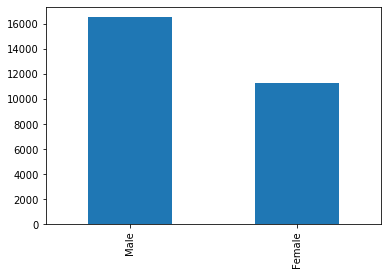

In [10]:
df["gender"].value_counts().plot.bar()

In [11]:
df["gender"].value_counts()/len(df["gender"])*100

Male      58.304559
Female    39.845677
Name: gender, dtype: float64

In [12]:
df["occupation"].value_counts()/len(df["occupation"])*100

self_employed    61.574237
salaried         23.620605
student           7.251075
retired           7.131280
company           0.140934
Name: occupation, dtype: float64

Now some Categorical variables

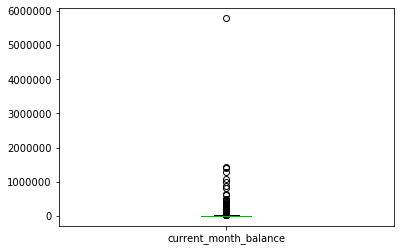

In [13]:
df["current_month_balance"].plot.box()

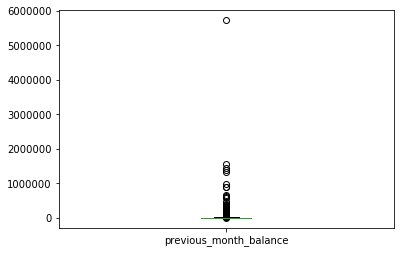

In [14]:
df["previous_month_balance"].plot.box()

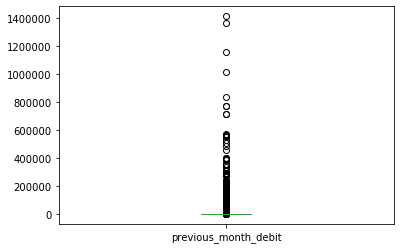

In [15]:
df["previous_month_debit"].plot.box()

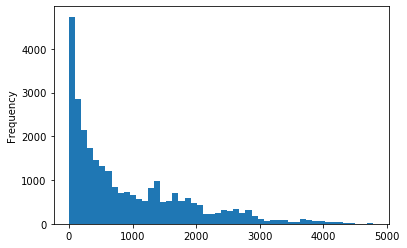

In [16]:
df["branch_code"].plot.hist(bins=50)

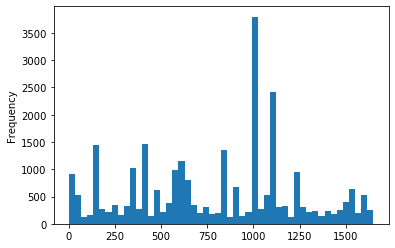

In [17]:
df["city"].plot.hist(bins=50)

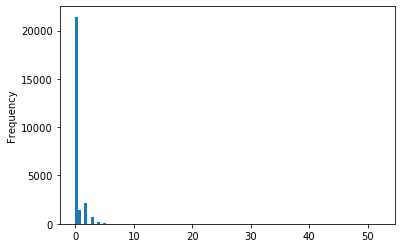

In [18]:
df["dependents"].plot.hist(bins=100)

In [19]:
df["dependents"].value_counts()

0.0     21435
2.0      2150
1.0      1395
3.0       701
4.0       179
5.0        41
6.0         8
7.0         3
36.0        1
52.0        1
25.0        1
9.0         1
50.0        1
32.0        1
8.0         1
Name: dependents, dtype: int64

In [20]:
df["occupation"].value_counts()

self_employed    17476
salaried          6704
student           2058
retired           2024
company             40
Name: occupation, dtype: int64

Bivariant Analysis

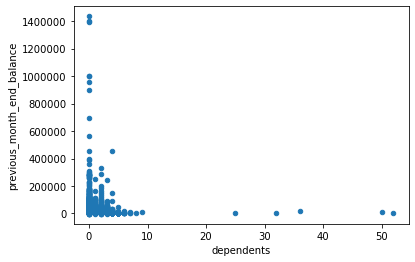

In [21]:
df.plot.scatter("dependents","previous_month_end_balance")

In [22]:
df["dependents"].corr(df["previous_month_end_balance"])

0.00021566645383390299

In [23]:
df.corr()

,customer_id,vintage,age,dependents,city,customer_nw_category,branch_code,days_since_last_transaction,current_balance,previous_month_end_balance,average_monthly_balance_prevQ,average_monthly_balance_prevQ2,current_month_credit,previous_month_credit,current_month_debit,previous_month_debit,current_month_balance,previous_month_balance,churn
customer_id,1.000000,-0.006093,-0.000442,-0.008616,0.000743,0.009618,-0.000286,0.010267,0.006589,0.005819,0.004485,-0.002532,0.002494,-0.006414,0.002603,-0.008760,0.005140,0.004553,-0.002723
vintage,-0.006093,1.000000,0.227390,0.036987,0.044200,-0.167366,-0.380714,-0.088744,0.002986,0.004518,0.003433,0.002244,0.002848,0.028034,0.005406,0.023949,0.001638,0.003448,-0.064637
age,-0.000442,0.227390,1.000000,-0.000612,0.015439,-0.076532,-0.058990,-0.016679,0.054346,0.058342,0.061708,0.059607,0.023840,0.029961,0.027702,0.033296,0.057662,0.060297,-0.020012
dependents,-0.008616,0.036987,-0.000612,1.000000,0.001892,0.013134,0.020141,-0.079834,-0.003070,0.000216,0.001213,0.002949,0.003260,0.025054,0.008207,0.032021,-0.000652,0.001239,0.033487
city,0.000743,0.044200,0.015439,0.001892,1.000000,0.006613,-0.061234,-0.004309,-0.005654,-0.004089,-0.006298,-0.007891,0.004118,0.008087,0.001465,0.005995,-0.005796,-0.005839,-0.001585
customer_nw_category,0.009618,-0.167366,-0.076532,0.013134,0.006613,1.000000,0.235059,0.049531,-0.058314,-0.059854,-0.059535,-0.047010,-0.025254,-0.072374,-0.035917,-0.071721,-0.058648,-0.059113,0.006551
branch_code,-0.000286,-0.380714,-0.058990,0.020141,-0.061234,0.235059,1.000000,0.038708,0.000181,0.000214,0.001955,0.001310,-0.013988,-0.023849,-0.016944,-0.017584,0.001031,0.002080,0.035469
days_since_last_transaction,0.010267,-0.088744,-0.016679,-0.079834,-0.004309,0.049531,0.038708,1.000000,-0.019990,-0.014400,-0.012709,-0.006384,-0.033131,-0.071657,-0.039165,-0.070192,-0.017837,-0.011738,-0.055830
current_balance,0.006589,0.002986,0.054346,-0.003070,-0.005654,-0.058314,0.000181,-0.019990,1.000000,0.947276,0.958307,0.714600,0.030371,0.061754,0.044412,0.081247,0.983412,0.942207,-0.024181
previous_month_end_balance,0.005819,0.004518,0.058342,0.000216,-0.004089,-0.059854,0.000214,-0.014400,0.947276,1.000000,0.970530,0.722998,0.032493,0.114222,0.066329,0.109606,0.974714,0.969605,0.006886


In [24]:
df["average_monthly_balance_prevQ"].corr(df["current_balance"])

0.9583070699816755

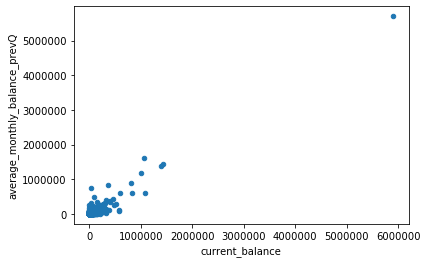

In [25]:
df.plot.scatter("current_balance","average_monthly_balance_prevQ")

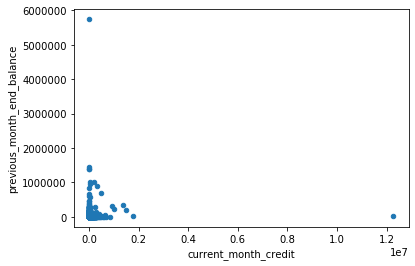

In [26]:
df.plot.scatter("current_month_credit","previous_month_end_balance")

In [27]:
df["average_monthly_balance_prevQ2"].corr(df["current_month_credit"])

0.03627061862636574

In [28]:
df.corr()

,customer_id,vintage,age,dependents,city,customer_nw_category,branch_code,days_since_last_transaction,current_balance,previous_month_end_balance,average_monthly_balance_prevQ,average_monthly_balance_prevQ2,current_month_credit,previous_month_credit,current_month_debit,previous_month_debit,current_month_balance,previous_month_balance,churn
customer_id,1.000000,-0.006093,-0.000442,-0.008616,0.000743,0.009618,-0.000286,0.010267,0.006589,0.005819,0.004485,-0.002532,0.002494,-0.006414,0.002603,-0.008760,0.005140,0.004553,-0.002723
vintage,-0.006093,1.000000,0.227390,0.036987,0.044200,-0.167366,-0.380714,-0.088744,0.002986,0.004518,0.003433,0.002244,0.002848,0.028034,0.005406,0.023949,0.001638,0.003448,-0.064637
age,-0.000442,0.227390,1.000000,-0.000612,0.015439,-0.076532,-0.058990,-0.016679,0.054346,0.058342,0.061708,0.059607,0.023840,0.029961,0.027702,0.033296,0.057662,0.060297,-0.020012
dependents,-0.008616,0.036987,-0.000612,1.000000,0.001892,0.013134,0.020141,-0.079834,-0.003070,0.000216,0.001213,0.002949,0.003260,0.025054,0.008207,0.032021,-0.000652,0.001239,0.033487
city,0.000743,0.044200,0.015439,0.001892,1.000000,0.006613,-0.061234,-0.004309,-0.005654,-0.004089,-0.006298,-0.007891,0.004118,0.008087,0.001465,0.005995,-0.005796,-0.005839,-0.001585
customer_nw_category,0.009618,-0.167366,-0.076532,0.013134,0.006613,1.000000,0.235059,0.049531,-0.058314,-0.059854,-0.059535,-0.047010,-0.025254,-0.072374,-0.035917,-0.071721,-0.058648,-0.059113,0.006551
branch_code,-0.000286,-0.380714,-0.058990,0.020141,-0.061234,0.235059,1.000000,0.038708,0.000181,0.000214,0.001955,0.001310,-0.013988,-0.023849,-0.016944,-0.017584,0.001031,0.002080,0.035469
days_since_last_transaction,0.010267,-0.088744,-0.016679,-0.079834,-0.004309,0.049531,0.038708,1.000000,-0.019990,-0.014400,-0.012709,-0.006384,-0.033131,-0.071657,-0.039165,-0.070192,-0.017837,-0.011738,-0.055830
current_balance,0.006589,0.002986,0.054346,-0.003070,-0.005654,-0.058314,0.000181,-0.019990,1.000000,0.947276,0.958307,0.714600,0.030371,0.061754,0.044412,0.081247,0.983412,0.942207,-0.024181
previous_month_end_balance,0.005819,0.004518,0.058342,0.000216,-0.004089,-0.059854,0.000214,-0.014400,0.947276,1.000000,0.970530,0.722998,0.032493,0.114222,0.066329,0.109606,0.974714,0.969605,0.006886


In [29]:
df.groupby("gender")["dependents"].mean()

gender
Female    0.121538
Male      0.503766
Name: dependents, dtype: float64

In [30]:
from scipy.stats import ttest_ind

In [31]:
pd.crosstab(df["gender"],df["churn"])

churn,0,1
gender,,
Female,9324,1985
Male,13379,3169


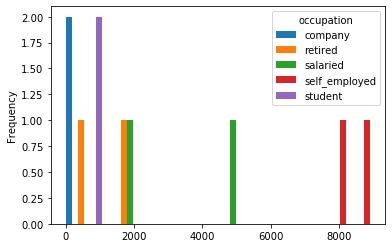

In [32]:
pd.crosstab(df["gender"],df["occupation"]).plot.hist(bins=50)

In [33]:
pd.crosstab(df["gender"],df["occupation"])

occupation,company,retired,salaried,self_employed,student
gender,,,,,
Female,6,389,1838,8053,1006
Male,28,1634,4864,8911,1052


In [34]:
pd.crosstab(df["churn"],df["occupation"])

occupation,company,retired,salaried,self_employed,student
churn,,,,,
0,36,1719,5557,14009,1734
1,4,305,1147,3467,324


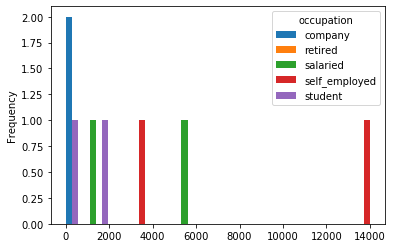

In [35]:
pd.crosstab(df["churn"],df["occupation"]).plot.hist(bins=50)

In [36]:
from scipy.stats import chi2_contingency

In [37]:
chi2_contingency(pd.crosstab(df["gender"],df["churn"]))

(11.270738823296812,
 0.0007873838498074115,
 1,
 array([[ 9216.65028539,  2092.34971461],
        [13486.34971461,  3061.65028539]]))

In [38]:
chi2_contingency(pd.crosstab(df["gender"],df["occupation"]))

(1263.1194370636574,
 3.297621316393365e-272,
 4,
 array([[   13.8198049 ,   822.27839171,  2724.12742522,  6895.26971671,
           836.50466146],
        [   20.1801951 ,  1200.72160829,  3977.87257478, 10068.73028329,
          1221.49533854]]))

In [39]:
chi2_contingency(pd.crosstab(df["churn"],df["occupation"]))

(57.33701557319584,
 1.051286209239775e-11,
 4,
 array([[3.25842697e+01, 1.64876404e+03, 5.46112360e+03, 1.42360674e+04,
         1.67646067e+03],
        [7.41573034e+00, 3.75235955e+02, 1.24287640e+03, 3.23993258e+03,
         3.81539326e+02]]))

In [40]:
males=df[df["gender"]=="Male"]
females=df[df["gender"]=="Female"]

In [41]:
ttest_ind(males["dependents"],females["dependents"],nan_policy="omit")

Ttest_indResult(statistic=30.408481173214508, pvalue=1.49406134536556e-199)

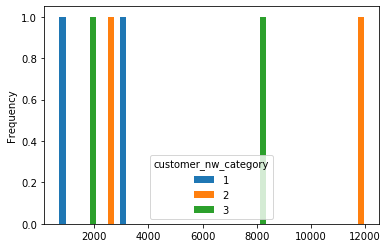

In [42]:
pd.crosstab(df["churn"],df["customer_nw_category"]).plot.hist(bins=50)

In [43]:
chi2_contingency(pd.crosstab(df["churn"],df["customer_nw_category"]))

(7.955973344599787,
 0.018723297549445427,
 2,
 array([[ 3023.24508491, 11860.79902755,  8237.95588753],
        [  687.75491509,  2698.20097245,  1874.04411247]]))

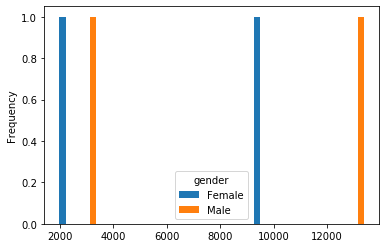

In [44]:
pd.crosstab(df["churn"],df["gender"]).plot.hist(bins=50)

Missing Values termination

In [45]:
df.isnull().sum()

customer_id                          0
vintage                              0
age                                  0
gender                             525
dependents                        2463
occupation                          80
city                               803
customer_nw_category                 0
branch_code                          0
days_since_last_transaction       3223
current_balance                      0
previous_month_end_balance           0
average_monthly_balance_prevQ        0
average_monthly_balance_prevQ2       0
current_month_credit                 0
previous_month_credit                0
current_month_debit                  0
previous_month_debit                 0
current_month_balance                0
previous_month_balance               0
churn                                0
dtype: int64

In [46]:
df["gender"].head(10)

0      Male
1      Male
2      Male
3       NaN
4      Male
5    Female
6      Male
7      Male
8      Male
9      Male
Name: gender, dtype: object

In [51]:
mode=df["gender"].mode()
mode

0    Male
dtype: object

In [52]:
df["gender"]=df["gender"].fillna(value="Male")
df["gender"].head(10)

0      Male
1      Male
2      Male
3      Male
4      Male
5    Female
6      Male
7      Male
8      Male
9      Male
Name: gender, dtype: object

In [56]:
df['occupation'].isnull().sum()

80

In [57]:
mode2=df["occupation"].mode()
mode2

0    self_employed
dtype: object

In [58]:
mode3=df["dependents"].mode()
mode3

0    0.0
dtype: float64

In [59]:
df["occupation"]=df["occupation"].fillna(value="self_employed")
df["dependents"]=df["dependents"].fillna(value=0)

In [60]:
df.isnull().sum()

customer_id                          0
vintage                              0
age                                  0
gender                               0
dependents                           0
occupation                           0
city                               803
customer_nw_category                 0
branch_code                          0
days_since_last_transaction       3223
current_balance                      0
previous_month_end_balance           0
average_monthly_balance_prevQ        0
average_monthly_balance_prevQ2       0
current_month_credit                 0
previous_month_credit                0
current_month_debit                  0
previous_month_debit                 0
current_month_balance                0
previous_month_balance               0
churn                                0
dtype: int64

Normalization or Scaling of data

In [73]:
#Segregating Independent and Dependent Variables
x3=df.drop(["days_since_last_transaction"],axis=1)
x2=x3.drop(["churn"],axis=1)
x1=x2.drop(["city"],axis=1)
x=x1.drop(["customer_id"],axis=1)
y=df["churn"]
x.shape , y.shape

((28382, 17), (28382,))

In [74]:
x=pd.get_dummies(x)

In [75]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
x_fited=scaler.fit_transform(x)

In [76]:
x=pd.DataFrame(x_fited,columns=x.columns)
x.head()

,vintage,age,dependents,customer_nw_category,branch_code,current_balance,previous_month_end_balance,average_monthly_balance_prevQ,average_monthly_balance_prevQ2,current_month_credit,...,previous_month_debit,current_month_balance,previous_month_balance,gender_Female,gender_Male,occupation_company,occupation_retired,occupation_salaried,occupation_self_employed,occupation_student
0,0.232330,0.730337,0.000000,0.5,0.157708,0.001178,0.000802,0.000005,0.003572,1.548512e-08,...,1.343546e-07,0.000836,0.001158,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,0.010221,0.382022,0.000000,0.5,0.672035,0.001843,0.002064,0.001118,0.005754,4.482534e-08,...,7.110188e-05,0.001707,0.002438,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.171083,0.337079,0.000000,0.5,0.008366,0.001593,0.001561,0.000611,0.003844,4.890037e-08,...,1.833021e-04,0.001450,0.001789,0.0,1.0,0.0,0.0,1.0,0.0,0.0
3,0.023430,1.000000,0.000000,0.5,0.121523,0.001319,0.000947,0.000115,0.003484,3.749028e-08,...,1.515605e-03,0.000980,0.001195,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,0.184842,0.460674,0.038462,1.0,0.080945,0.001088,0.000792,0.000038,0.003656,2.608020e-08,...,1.087601e-03,0.000784,0.001196,0.0,1.0,0.0,0.0,0.0,1.0,0.0


KNN

In [79]:
from sklearn.model_selection import train_test_split
train_x,test_x,train_y,test_y=train_test_split(x,y, random_state=96,stratify=y)

K fold Cross Validation

In [80]:
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.model_selection import cross_val_score 

In [81]:
score=cross_val_score(KNN(n_neighbors=5),X=train_x,y=train_y,cv=10)
score

array([0.78581494, 0.78487553, 0.79098168, 0.78957257, 0.78816346,
       0.78487553, 0.78712406, 0.78900376, 0.79182331, 0.79229323])

In [82]:
score.mean()*100 , score.std()*100

(78.84528062170457, 0.26165486788225567)

In [83]:
def vales(k):
    meanarg=[]
    stdarg=[]
    for i in k:
        score=cross_val_score(KNN(n_neighbors=i),X=train_x,y=train_y,cv=10)
        meanarg.append(score.mean()*100)
        stdarg.append(score.std()*100)
    return(meanarg,stdarg)


In [84]:
k=[i for i in range(0,50)]

In [85]:
means,stds=vales(k)

Text(0.5, 1.0, 'Mean Graph')

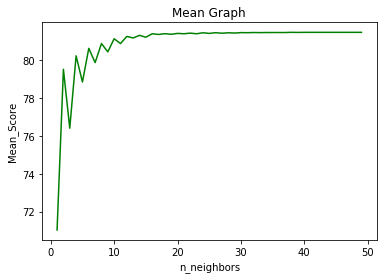

In [86]:
plt.plot(k,means,color="green",label="Mean")
plt.xlabel("n_neighbors")
plt.ylabel("Mean_Score")
plt.title("Mean Graph")

Text(0.5, 1.0, 'Mean Graph')

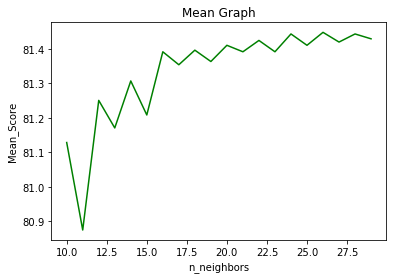

In [88]:
plt.plot(k[10:30],means[10:30],color="green",label="Mean")
plt.xlabel("n_neighbors")
plt.ylabel("Mean_Score")
plt.title("Mean Graph")

Text(0.5, 1.0, 'Deviation Graph')

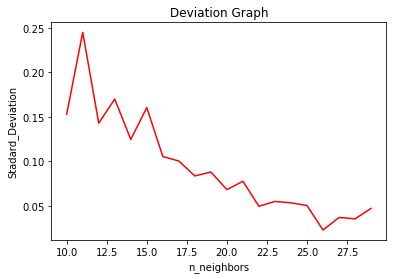

In [90]:
plt.plot(k[10:30],stds[10:30],color="red",label="Standard_deviation")
plt.xlabel("n_neighbors")
plt.ylabel("Stadard_Deviation")
plt.title("Deviation Graph")

In [93]:
clf=KNN(n_neighbors=18)
clf.fit(train_x,train_y)
score1=clf.score(train_x,train_y)
scre=clf.score(test_x,test_y)
score1,scre

(0.8147138964577657, 0.814120631341601)